<a href="https://colab.research.google.com/github/nickocruzm/Research299/blob/main/Align_Your_Steps_usage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook provides a minimal code example for Align Your Steps, showcasing the benefits of using optimized sampling schedules in diffusion models.
Check out our project page for more details: [https://research.nvidia.com/labs/toronto-ai/AlignYourSteps](https://research.nvidia.com/labs/toronto-ai/AlignYourSteps)

# Installing and loading libraries (This may take a while)

In [1]:
%%capture
!pip install diffusers accelerate

In [2]:
import torch
import numpy as np

from diffusers import StableDiffusionPipeline
from diffusers.utils import make_image_grid

from IPython.display import display

# Utils

In [3]:
from diffusers import DPMSolverMultistepScheduler as DefaultDPMSolver

# Add support for setting custom timesteps
class DPMSolverMultistepScheduler(DefaultDPMSolver):
    def set_timesteps(
        self, num_inference_steps=None, device=None,
        timesteps=None
    ):
        if timesteps is None:
            super().set_timesteps(num_inference_steps, device)
            return

        all_sigmas = np.array(((1 - self.alphas_cumprod) / self.alphas_cumprod) ** 0.5)
        self.sigmas = torch.from_numpy(all_sigmas[timesteps])
        self.timesteps = torch.tensor(timesteps[:-1]).to(device=device, dtype=torch.int64) # Ignore the last 0

        self.num_inference_steps = len(timesteps)

        self.model_outputs = [
            None,
        ] * self.config.solver_order
        self.lower_order_nums = 0

        # add an index counter for schedulers that allow duplicated timesteps
        self._step_index = None
        self._begin_index = None
        self.sigmas = self.sigmas.to("cpu")  # to avoid too much CPU/GPU communication

# Stable Diffusion 1.5

In [4]:
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, dtype=torch.float16, variant="fp16").to("cuda")
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

safety_checker/model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/1.72G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/10 [00:00<?, ?it/s]

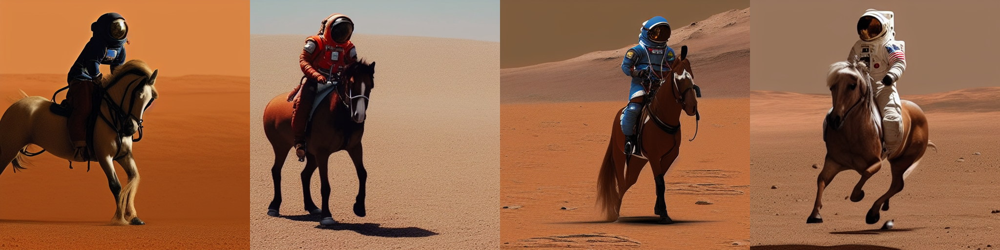

  0%|          | 0/10 [00:00<?, ?it/s]

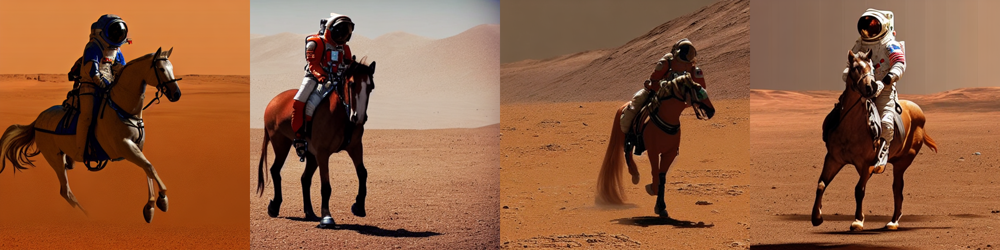

In [5]:
seed = 10
num_steps = 10
sampling_schedule = [999, 850, 736, 645, 545, 455, 343, 233, 124, 24, 0]
prompt = "a photo of an astronaut riding a horse on mars"

# Default schedule
torch.manual_seed(seed)
default_images = pipe(
    prompt, num_images_per_prompt=4,
    num_inference_steps=num_steps,
).images
display(make_image_grid(default_images, rows=1, cols=len(default_images)))

# AYS schedule
torch.manual_seed(seed)
ays_images = pipe(
    prompt, num_images_per_prompt=4,
    timesteps=sampling_schedule,
).images
display(make_image_grid(ays_images, rows=1, cols=len(ays_images)))

# SDXL

In [6]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [7]:
from diffusers import StableDiffusionXLPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16, variant="fp16", use_safetensors=True,
    vae=vae,
    add_watermarker=False,
).to("cuda")

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae_1_0/diffusion_pytorch_model.fp16.saf(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

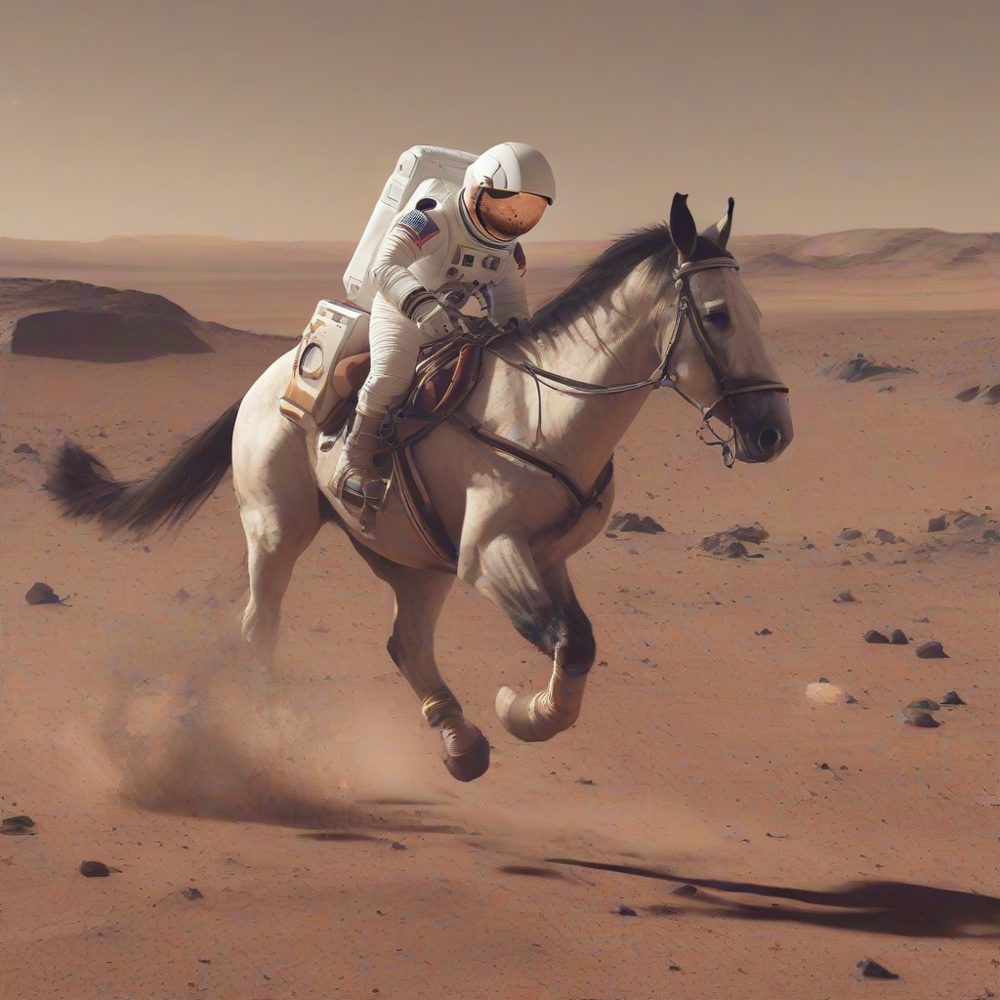

  0%|          | 0/10 [00:00<?, ?it/s]

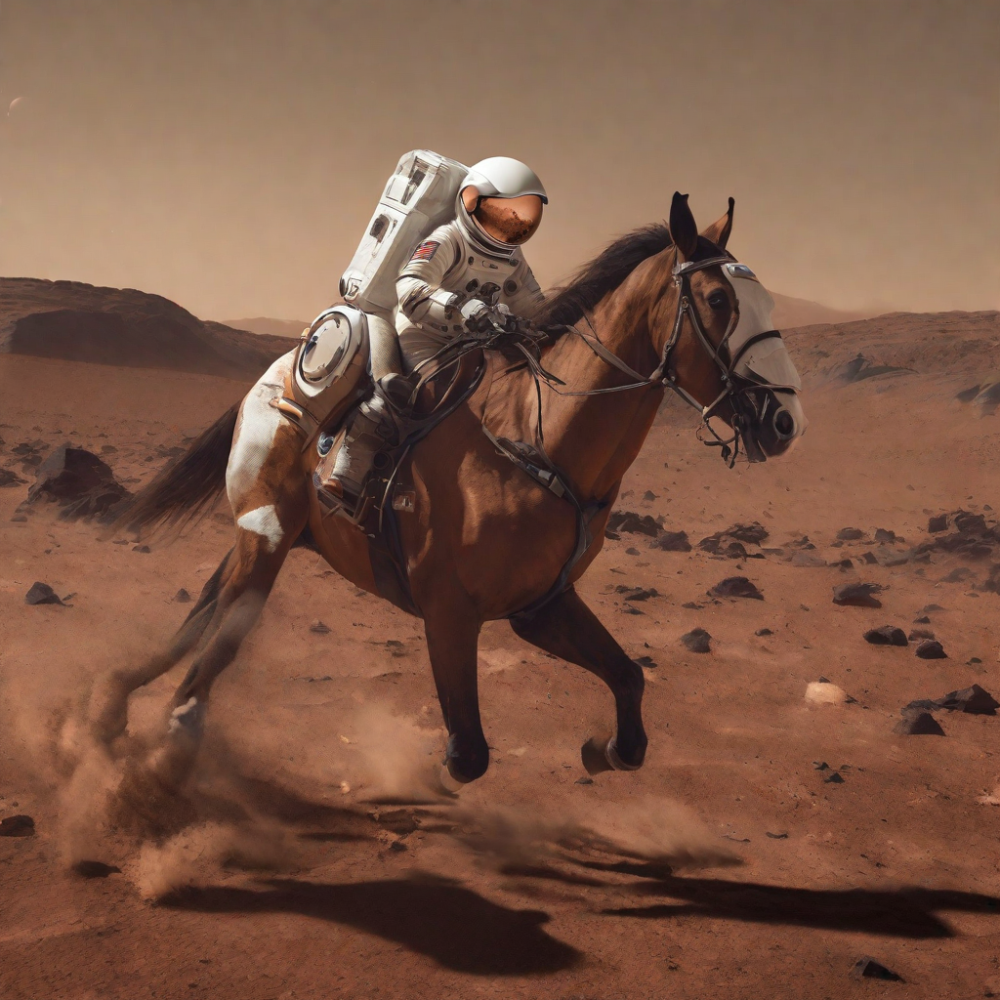

In [14]:
gc.collect()
torch.cuda.empty_cache()
seed = 20
num_steps = 10
sampling_schedule = [999, 845, 730, 587, 443, 310, 193, 116, 53, 13, 0]
prompt = "a photo of an astronaut riding a horse on mars"
negative_prompt = ""

# Default schedule
torch.manual_seed(seed)
default_images = pipe(
    prompt, negative_prompt=negative_prompt,
    num_images_per_prompt=1,
    num_inference_steps=num_steps,
).images
display(make_image_grid(default_images, rows=1, cols=len(default_images)))

# AYS schedule
torch.manual_seed(seed)
ays_images = pipe(
    prompt, negative_prompt=negative_prompt,
    num_images_per_prompt=1,
    timesteps=sampling_schedule,
).images
display(make_image_grid(ays_images, rows=1, cols=1))